In [2]:
import pandas as pd
import warnings
from causalnex.structure import StructureModel
from IPython.display import Image
from causalnex.plots import plot_structure, NODE_STYLE, EDGE_STYLE
import CausalnexDataset as cd


file = '../../../datasets/preprocess_mars_express/MarsExpressPower/marsexpress_dataset.csv'
a = cd.CausalnexDataset(dataset=file, delimiter_char=",", columns_to_drop=["ut_ms"], dropna=True, threshold=0.8)

C:\ProgramData\Anaconda3\lib\site-packages\causalnex\structure\notears.py:436: UserWarning: Failed to converge. Consider increasing max_iter.
  warnings.warn("Failed to converge. Consider increasing max_iter.")


Run Image(result.draw(format='png')) to draw the graph


C:\ProgramData\Anaconda3\lib\site-packages\pygraphviz\agraph.py:1400: RuntimeWarning: Warning: node 'NPWD2372', graph '' size too small for label

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\pygraphviz\agraph.py:1400: RuntimeWarning: Warning: node 'NPWD2372', graph '' size too small for label

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)


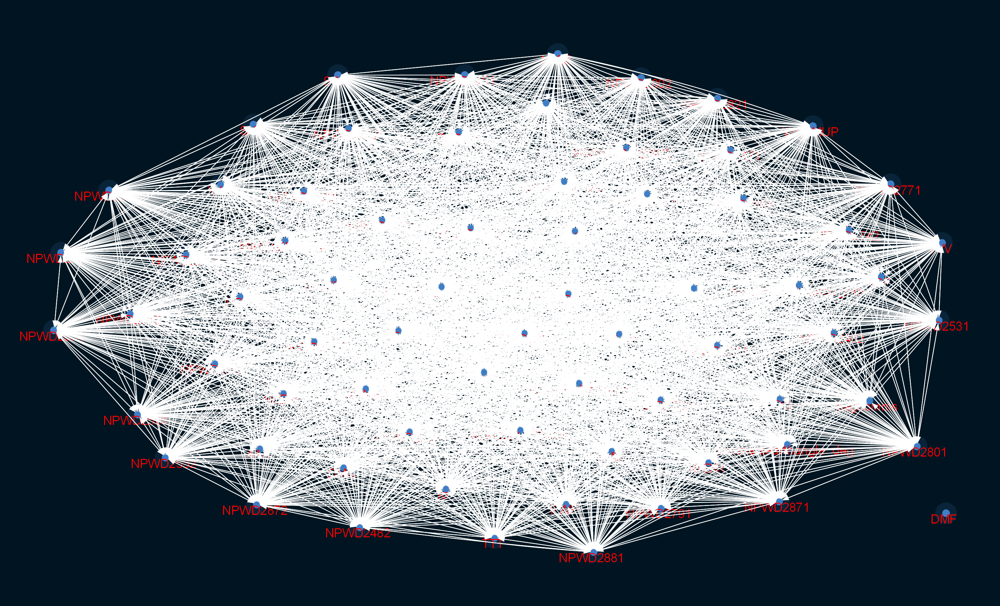

In [3]:

viz = a.get_graph()

Image(viz.draw(format="png"))

In [13]:
# Obtenemos los datos estadísticos de la matriz de adyancencia para planear un cribado de las relaciones espurias y menos relevantes
a.reset_threshold(0)
a.get_edges_data()

C:\ProgramData\Anaconda3\lib\site-packages\causalnex\structure\notears.py:436: UserWarning: Failed to converge. Consider increasing max_iter.
  warnings.warn("Failed to converge. Consider increasing max_iter.")


,weight
count,3.752000e+03
mean,3.106906e-04
std,1.776188e-02
min,1.455402e-26
25%,5.074130e-21
50%,4.459348e-19
75%,2.897021e-17
max,1.085003e+00


Run Image(result.draw(format='png')) to draw the graph


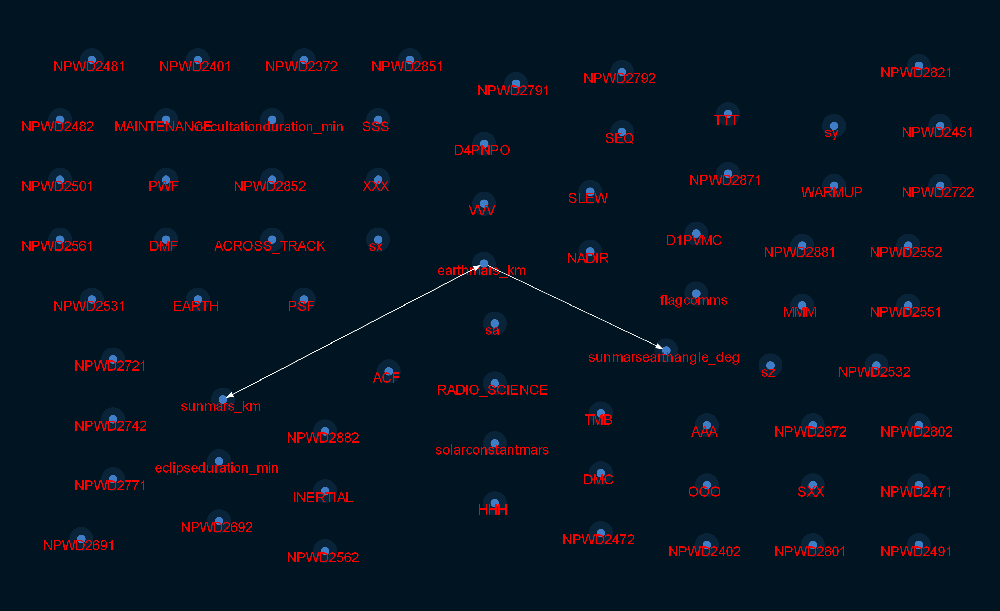

In [15]:
# Aunque la media no es un valor muy representativo por quedar muy por encima de los tres cuartiles, la elegiremos en este caso para compensar la gran cantidad de pesos demasiado pequeños.
# Utilizaremos esta media para quedarnos solo con aquellos nodos con pesos que la superen y utilizarla como umbral de pesos en el grafo. 
mean = 3.106906e-04
a.reset_threshold(mean)
viz = a.get_graph()

Image(viz.draw(format="png"))

C:\ProgramData\Anaconda3\lib\site-packages\causalnex\structure\notears.py:436: UserWarning: Failed to converge. Consider increasing max_iter.
  warnings.warn("Failed to converge. Consider increasing max_iter.")


Run Image(result.draw(format='png')) to draw the graph


C:\ProgramData\Anaconda3\lib\site-packages\pygraphviz\agraph.py:1400: RuntimeWarning: Warning: node 'NPWD2372', graph '' size too small for label

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\pygraphviz\agraph.py:1400: RuntimeWarning: Warning: node 'NPWD2372', graph '' size too small for label

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)


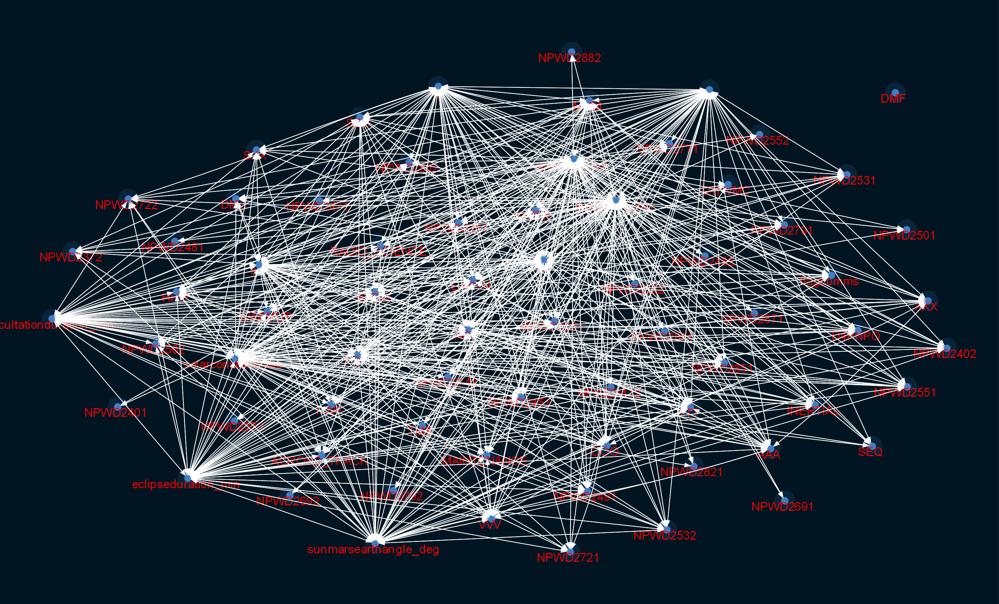

In [17]:
# La media es un valor demasiado alto, solo dos aristas han superado el umbral. Probaremos con el tercer cuartil.
q3 = 2.897021e-17
a.reset_threshold(q3)
viz = a.get_graph()

Image(viz.draw(format="png"))

In [18]:
# El cuartil 3 tiene un valor demasiado bajo y nos proporciona más relaciones de las que cabría esperar. Vamos a examinar los pesos más elevados para poder elegir un umbral razonable.

df = a.edges_to_dataframe().sort_values("weight", ascending=False)
df.head(60)


,source,target,weight
367,sunmars_km,earthmars_km,1.085003e+00
432,earthmars_km,sunmars_km,8.070393e-02
369,sunmars_km,solarconstantmars,1.307852e-06
433,earthmars_km,solarconstantmars,1.054588e-06
366,sunmars_km,sz,3.548845e-07
365,sunmars_km,sy,2.636294e-07
368,sunmars_km,sunmarsearthangle_deg,1.088616e-07
364,sunmars_km,sx,1.065811e-07
430,earthmars_km,sy,1.040505e-07
431,earthmars_km,sz,8.287077e-08


C:\ProgramData\Anaconda3\lib\site-packages\causalnex\structure\notears.py:436: UserWarning: Failed to converge. Consider increasing max_iter.
  warnings.warn("Failed to converge. Consider increasing max_iter.")


Run Image(result.draw(format='png')) to draw the graph


C:\ProgramData\Anaconda3\lib\site-packages\pygraphviz\agraph.py:1400: RuntimeWarning: Warning: node 'NPWD2372', graph '' size too small for label

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)


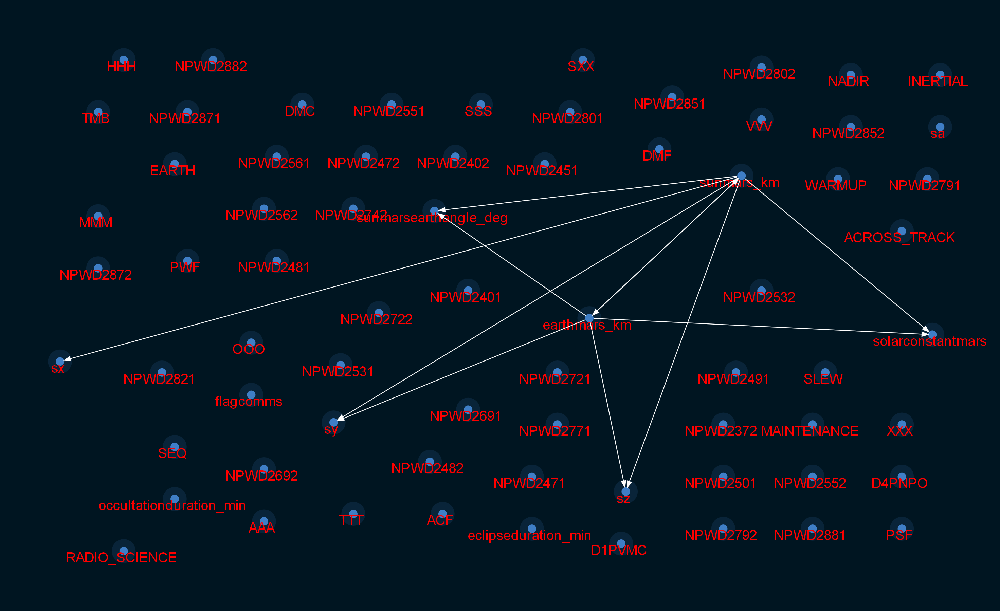

In [19]:
# Vemos que a partir de 7.707169e-08 empiezan a entrar relaciones que a priori tienen poco sentido, así que estableceremos el umbral ahí.

a.reset_threshold(7.707169e-08)

viz = a.get_graph()

Image(viz.draw(format="png"))

Run Image(result.draw(format='png')) to draw the graph


C:\ProgramData\Anaconda3\lib\site-packages\pygraphviz\agraph.py:1400: RuntimeWarning: Warning: node 'solarconstantmars', graph '' size too small for label

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)


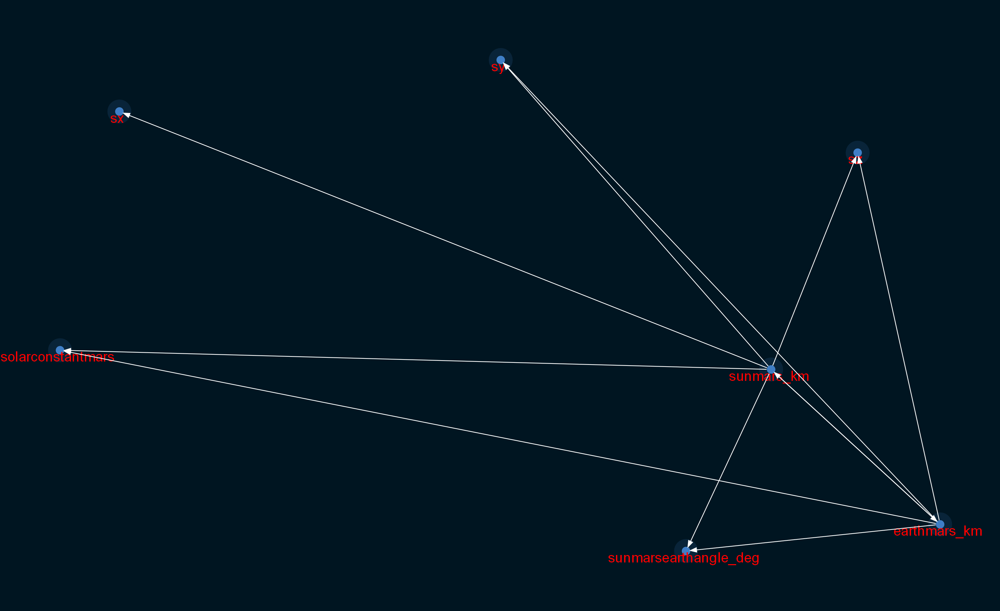

In [20]:
# Nos quedamos solo con el subgrafo que nos interesa

viz = a.get_graph(largest_subgraph=True)

Image(viz.draw(format="png"))

In [21]:
df = a.edges_to_dataframe()
df

,source,target,weight
0,sunmars_km,sx,1.065811e-07
1,sunmars_km,sy,2.636294e-07
2,sunmars_km,sz,3.548845e-07
3,sunmars_km,earthmars_km,1.085003e+00
4,sunmars_km,sunmarsearthangle_deg,1.088616e-07
5,sunmars_km,solarconstantmars,1.307852e-06
6,earthmars_km,sy,1.040505e-07
7,earthmars_km,sz,8.287077e-08
8,earthmars_km,sunmars_km,8.070393e-02
9,earthmars_km,solarconstantmars,1.054588e-06


Run Image(result.draw(format='png')) to draw the graph


C:\ProgramData\Anaconda3\lib\site-packages\pygraphviz\agraph.py:1400: RuntimeWarning: Warning: node 'solarconstantmars', graph '' size too small for label

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)


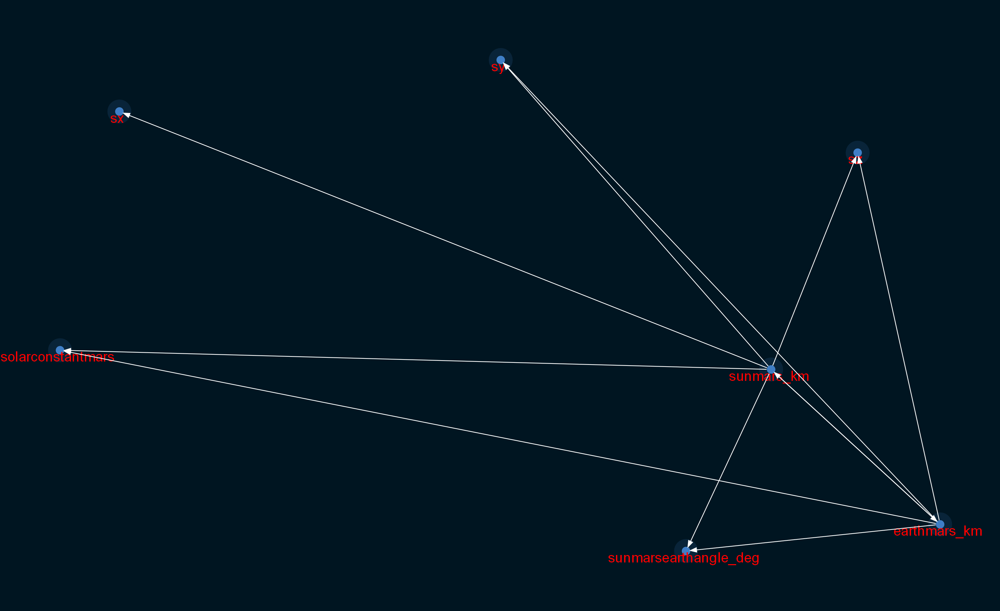

In [22]:
edges_to_remove = [(row["source"], row["target"]) for i, row in df.iterrows() if row["target"] in ["sunmars_km", "earthmars_km"] and row["source"] not in ["sunmars_km", "earthmars_km"]  ]
a.remove_edges(edges=edges_to_remove)

viz = a.get_graph(largest_subgraph=True)

Image(viz.draw(format="png"))

Run Image(result.draw(format='png')) to draw the graph


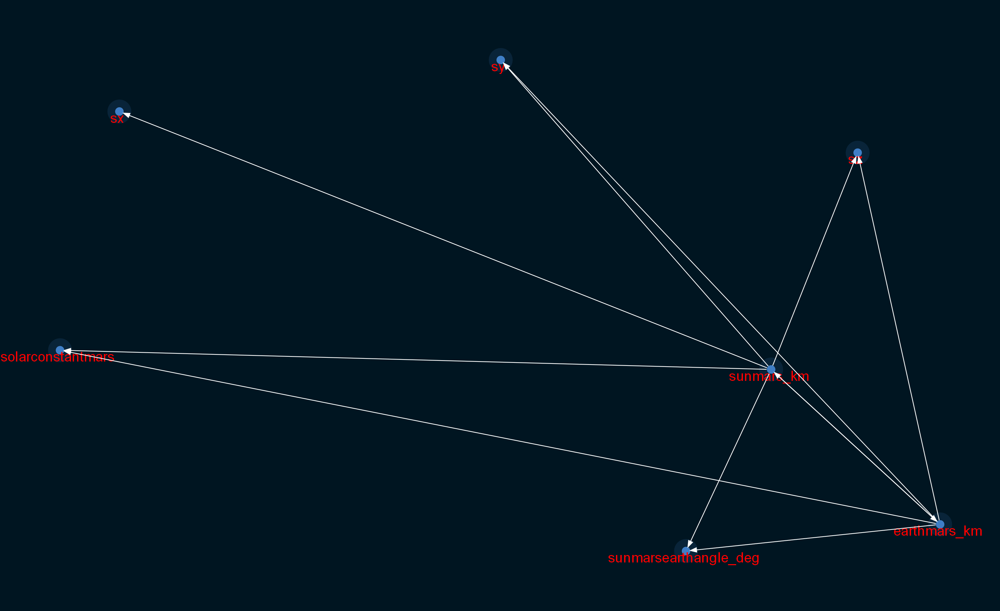

In [23]:
edges_to_add = [("earthmars_km", "sunmarsearthangle_deg")]
a.add_edges(edges=edges_to_add)


viz = a.get_graph(largest_subgraph=True)

Image(viz.draw(format="png"))